In [1]:
using LinearAlgebra, Plots, SparseArrays
using PolynomialRoots

In [2]:
function get_coeff_2kth_derviative(r,k=1)
    A = [2*i^(2*j)//factorial(2*j) for i=1:r, j=1:r]
    B = hcat(rotr90(Matrix(1I, r, r)), [-2 for i=1:r], Matrix(1I, r, r))
    coeff = inv(A)*B
    return Rational.(coeff[k,r+1:end])
end

# generate the matrix K from given potential
# Ψ_{n+1} = K * Ψ_n
function get_time_evolution_matrix(potential_vals; r=2, z_s = -2, Δt=Δt, Δx=Δx, mass=mass, ħ=ħ)

    b = (im * ħ * Δt) / (2 * mass * (Δx)^2)
    cn_coeffs = get_coeff_2kth_derviative(r)
    a_ks = (b / z_s) * cn_coeffs
    spatial_samples = length(potential_vals)
    d_js = (1 + a_ks[begin]) * ones(spatial_samples) - potential_vals * (im * Δt / ħ) / z_s


    I = [i for i = 1:spatial_samples]
    J = [j for j = 1:spatial_samples]
    S = d_js
    for k = 1:r
        upper_tri_i = [i for i = 1:spatial_samples-k]
        upper_tri_j = [i + k for i = 1:spatial_samples-k]

        I = vcat(I, upper_tri_i, upper_tri_j)
        J = vcat(J, upper_tri_j, upper_tri_i)

        S = vcat(S, a_ks[k+1] * ones(2 * (spatial_samples - k)))
    end

    A1 = Matrix(sparse(I, J, S))

    return inv(A1) * conj.(A1)
end

function pade_coeffs_exp(M)
    C = [1//factorial(i+j-1) for i in 1:M, j in 1:M]
    C_right = -[1//factorial(i+M) for i in 1:M]
    coeff = inv(C)*C_right
    b_rev = vcat(coeff,1)
    b = reverse(b_rev)    

    a = []
    s = +1
    for b_ in b
        a = vcat(a, s*b_)
        s = -s
    end

    return Rational.(a), b

end

function roots_pade_exp(M)
    a, b = pade_coeffs_exp(M)
    return roots(a), roots(b)
end

function get_pade_time_evolution_matrix(potential_vals; M=1, r = 3, Δt=Δt, Δx=Δx, mass=mass, ħ=ħ)
    K = 1I
    a_roots,_ = roots_pade_exp(M)
    for s in 1:M
        Ks = get_time_evolution_matrix(potential_vals; r=r, z_s = a_roots[s], Δt=Δt, Δx=Δx, mass=mass, ħ=ħ)
        K = K*Ks
    end
    return K
end

function plot_psi(wavefunc = x -> exp(-(x+20)^2/10 - im*5/ħ*x), potential = x -> 0;  r=4, M=3, Δx = 0.1, Δt = 0.1,  ħ = 1, mass = 1/2)
    
    x_vals = -50:Δx:50
    t_vals = 0:Δt:50

    # Initialize the wavefunction
    Ψ_vals = (wavefunc).(x_vals)
    Ψ_vals = Ψ_vals / sqrt(sum(Ψ_vals .* conj.(Ψ_vals)))

    potential_vals = (potential).(x_vals)
    Ψ_grid = copy(Ψ_vals)

    K = get_pade_time_evolution_matrix(potential_vals; M=M, r=r, Δt=Δt, Δx=Δx, mass=mass, ħ=ħ)

    for t_i in 2:length(t_vals)
        Ψ_grid = hcat(Ψ_grid, K * Ψ_grid[:,t_i-1])
    end    


    @gif for t_i in 1:length(t_vals)
        plot(x_vals,abs.(Ψ_grid[:,t_i]))
        ylims!(0,0.3)
        title!("M = $M \n t = $(round(t_vals[t_i], digits = 2))")
    end
end

function get_psi_grid(wavefunc = x -> exp(-(x+20)^2/10 - im*5/ħ*x), potential = x -> 0;  r=4, M=3, Δx = 0.1, Δt = 0.1,  ħ = 1, mass = 1/2)
    
    x_vals = -50:Δx:50
    t_vals = 0:Δt:50

    # Initialize the wavefunction
    Ψ_vals = (wavefunc).(x_vals)
    Ψ_vals = Ψ_vals / sqrt(sum(Ψ_vals .* conj.(Ψ_vals)))

    potential_vals = (potential).(x_vals)
    Ψ_grid = copy(Ψ_vals)

    K = get_pade_time_evolution_matrix(potential_vals; M=M, r=r, Δt=Δt, Δx=Δx, mass=mass, ħ=ħ)

    for t_i in 2:length(t_vals)
        Ψ_grid = hcat(Ψ_grid, K * Ψ_grid[:,t_i-1])
    end

    return Ψ_grid
end

get_psi_grid (generic function with 3 methods)

[ Info: Saved animation to /home/paras/repos/PYL800 Projects/1D TDSE/tmp.gif


Plots.AnimatedGif("/home/paras/repos/PYL800 Projects/1D TDSE/tmp.gif")
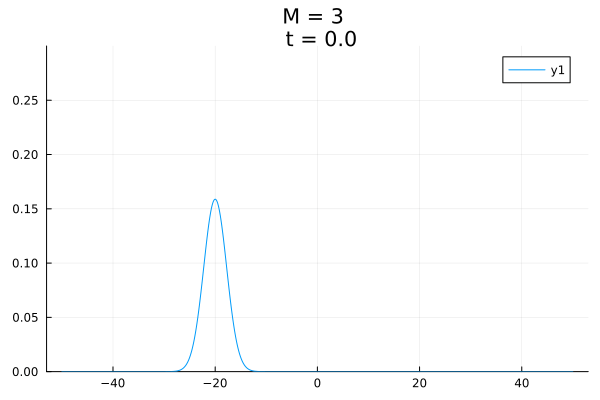

In [3]:
ħ = 1
mass = 1/2

wavefunc = x -> exp(-(x+20)^2/10 - im*5/ħ*x)
potential = x -> 0

plot_psi(wavefunc, potential)

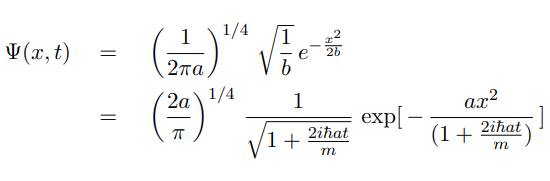

[ Info: Saved animation to /home/paras/repos/PYL800 Projects/1D TDSE/tmp.gif


Plots.AnimatedGif("/home/paras/repos/PYL800 Projects/1D TDSE/tmp.gif")
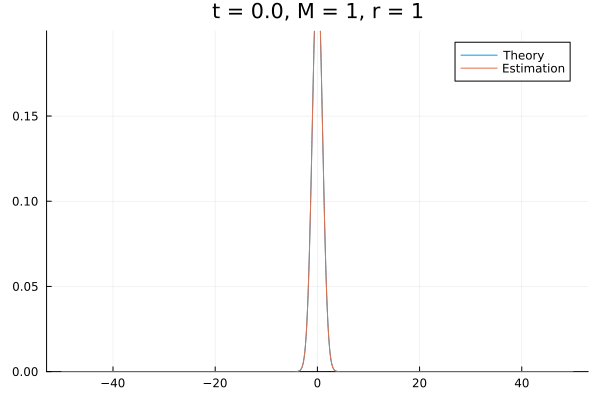

In [44]:
ħ = 1
mass = 1/2
a = 0.5
r = 1
M = 1

x_vals = -50:0.1:50
t_vals = 0:0.1:50

gaussian_wavefunc(x,t) = (2*a/π)^(1/4)*(1+2*a*im*ħ*t/mass)^(-1/2)*exp(-a*x^2/(1+2*a*im*ħ*t/mass))

gaussian_wavefunc_grid_theory = [gaussian_wavefunc(x, t) for x in x_vals, t in t_vals]
gaussian_wavefunc_grid_theory = gaussian_wavefunc_grid_theory ./ sqrt.(sum(gaussian_wavefunc_grid_theory .* conj.(gaussian_wavefunc_grid_theory), dims = 1))
gaussian_wavefunc_grid_estm =  get_psi_grid(x -> gaussian_wavefunc(x,0), potential; r=r, M=M, Δx = 0.1, Δt = 0.1,  ħ = 1, mass = 1/2)

@gif for t_i in 1:length(t_vals)
    plot(x_vals,abs.(gaussian_wavefunc_grid_theory[:,t_i]), label = "Theory")
    plot!(x_vals,abs.(gaussian_wavefunc_grid_estm[:,t_i]), label = "Estimation")
    ylims!(0,0.2)
    title!("t = $(round(t_vals[t_i], digits = 2)), M = $M, r = $r")
end

[ Info: Saved animation to /home/paras/repos/PYL800 Projects/1D TDSE/tmp.gif


Plots.AnimatedGif("/home/paras/repos/PYL800 Projects/1D TDSE/tmp.gif")
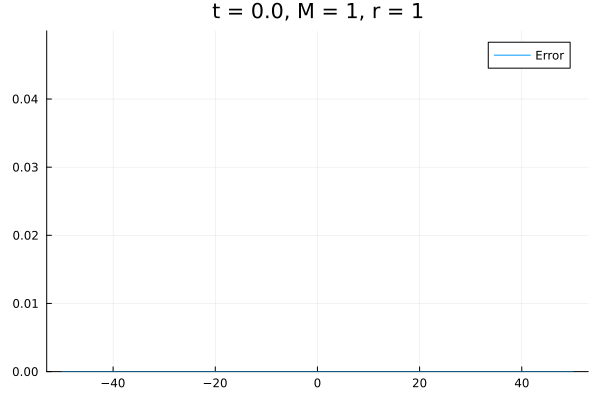

In [45]:
@gif for t_i in 1:length(t_vals)
    plot(x_vals,abs.(gaussian_wavefunc_grid_estm[:,t_i] - gaussian_wavefunc_grid_theory[:,t_i]), label = "Error")
    ylims!(0,0.05)
    title!("t = $(round(t_vals[t_i], digits = 2)), M = $M, r = $r")
end